In [ ]:
from collections import defaultdict


import re
import pickle
import unicodedata
import numpy as np
import pandas as pd


import nltk
from nltk.stem import LancasterStemmer
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from nltk.corpus import stopwords

from sklearn.pipeline import make_pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.feature_extraction.text import TfidfVectorizer 




def remove_brackets_and_inside(words):
    pattern = r'\[.*?\]'
    s = ' '.join(words)

    return (re.sub(pattern, ' ', s)).split()

def remove_unichar(words):   

    return [w for w in words if len(w)<=1]

def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', ' ', word)
        if new_word != '':
            new_words.append(new_word.strip().split())
            
    words = [j for i in new_words for j in i if len(j)>1]
    return words


def find_float(words):
    new_words = []
    w_index = defaultdict()#{w:i for i,w in enumerate(new_words)}
    i_word = defaultdict()#{j:i for i,j in w_index.items()}
    key = 0
    matches = []
    for word in words:
        find_match = [j for j in re.findall(r'[+]?(\d+\.\d+)?', word) if j!='']
        matches += find_match
        for w in find_match:
            if w not in w_index:
                w_index[w] = 'CODICEFLOAT_'+ str(key)
                i_word[w_index[w]] = w
                key += 1
            
    ss = ' '.join(words)
    for m in matches:
        ss = ss.replace(str(m), str(w_index[m]))
        
    return w_index, i_word, ss.split()
'''    
import inflect

def replace_numbers(words):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words
    
'''

def remove_stopwords(words):
    """Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stopwords.words('english'):
            new_words.append(word)
    return new_words

def stem_words(words):
    """Stem words in list of tokenized words"""
    stemmer = LancasterStemmer()
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems

def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

def _normalize(words):
    words = remove_non_ascii(words)
    words = to_lowercase(words)
    words = remove_brackets_and_inside(words)
    w_index, i_word, words = find_float(words)
    #print(words)
    #words = [w_index[w] for w in words]
    words = remove_punctuation(words)
    #words = replace_numbers(words)
    words = remove_stopwords(words)
    #words = stem_words(words)
    ss = ' '.join(words)
    for i, w in i_word.items():
        ss = ss.replace(i, w)
    
    words = ss.split()
    
    return words, w_index, i_word# 


def filter_len_words(length, words):
    return [w for w in words if len(w) >= length]


In [ ]:
"""
This cell is customized for data on my laptop. 
"""

# Define path of data
data = 'data/'
articles_file = data + 'covid_articles_updated_clean.p'


# Open the file
dict_articles = pickle.load(open(articles_file, 'rb'))


In [ ]:
_clean_dict_articles = {}
for idx, art in dict_articles.items():
    _clean_dict_articles[idx] = normalize(art.split())[0] 



In [ ]:
clean_dict_articles = {}
for idx, art in dict_articles.items():
    clean_dict_articles[idx] = _normalize(art.split())[0] 



In [ ]:
len(clean_dict_articles)

3155

In [ ]:

# Clean articles and get words count
#dict_articles = {idx:' '.join(art['text']) \
#                 for idx, art in dict_articles.items()}

#clean_dict_articles = {idx:normalize(art.split())[0] \
#                       for idx, art in dict_articles.items()}

In [ ]:
clean = defaultdict(list)
for i,j in clean_dict_articles.items():
    for w in j:
        if len(w)>3:
            clean[i] += [w]

In [ ]:
article_text = [(i, ' '.join(j)) for i,j in clean.items()]

id_articles = {i:j[0] for i,j in enumerate(article_text)}
articles_id = {j:i for i,j in id_articles.items()}

docs = [j for i,j in article_text]

In [ ]:
# Create tfidf matrix
tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 20)
tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(docs)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if  j < 3000}

In [ ]:
#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


len(tfidf_vectorizer.vocabulary_)

6734

# NUOVO

In [ ]:
from sklearn import metrics
from collections import defaultdict, Counter
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
import numpy as np
import pandas as pd
from os import path
import pickle

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from tqdm import tqdm_notebook as tqdm

import matplotlib.pyplot as plt
#w_normalized = normalize(tfidf_vectorizer_vectors, norm='l2', axis=1)

svd = TruncatedSVD(n_components=100, n_iter=20, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
Y = svd.fit_transform(tfidf_vectorizer_vectors)

# Pick 9 clusters
km = KMeans(n_clusters=10, init='k-means++')

y_km = km.fit_predict(Y)

Counter(y_km)

clusters = defaultdict(list)
for i in range(len(y_km)):
    clusters[y_km[i]] += [(article_text[i][0], article_text[i][1])]

In [ ]:
Counter(y_km)

Counter({8: 1423,
         9: 1490,
         4: 43,
         2: 67,
         1: 44,
         6: 15,
         7: 16,
         5: 10,
         3: 21,
         0: 26})

8
2076
9
2076
4
2076
2
2076
1
2076
6
2076
7
2076
5
2076
3
2076
0
2076


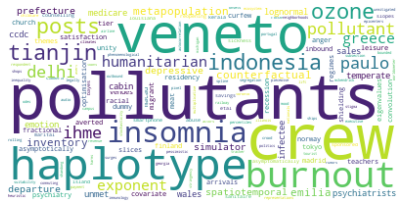

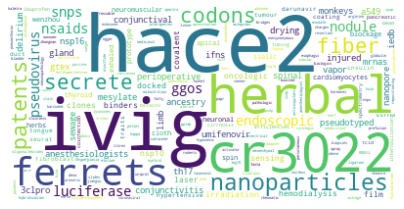

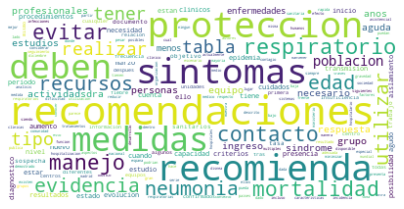

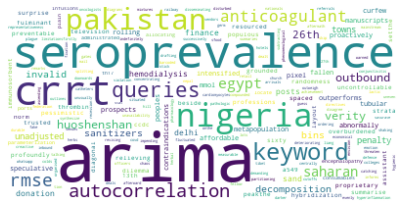

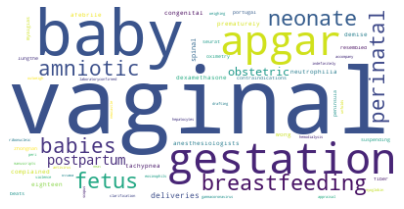

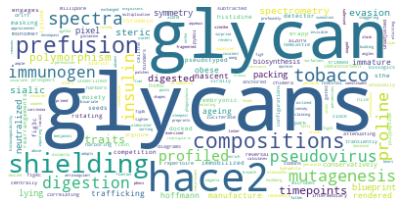

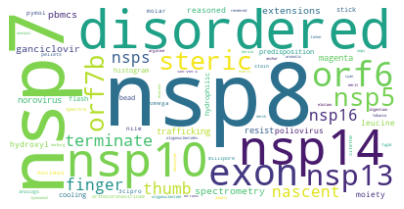

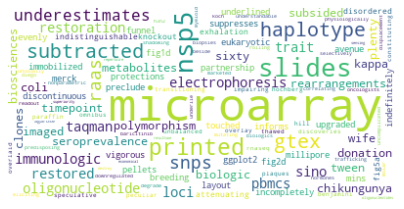

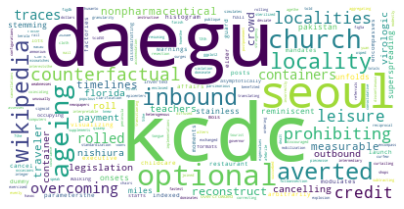

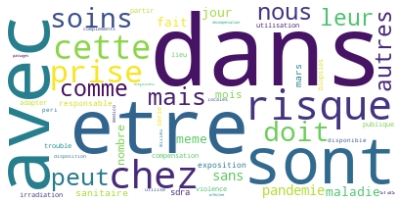

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a', 'funderit']

from collections import Counter
for c in Counter(list(y_km)):
    print(c)
    words = ' '.join([j for i,j in clusters[c]])
    new_voc = set(tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

# Save clusters

In [ ]:
clusters_id = defaultdict(list)
for c, l_art in clusters.items():
    for a in l_art:
        clusters_id[c].append(a[0])

In [ ]:
with open('level_1_clusters.pickle', 'wb') as handle:
    pickle.dump(clusters_id, handle)#, protocol=pickle.HIGHEST_PROTOCOL)

# Level 2

In [ ]:
# Create tfidf matrix
set_doc = [j for i,j in clusters[9]]
set_names = [i for i,j in clusters[9]]

#article_text = [(i, ' '.join(j)) for i,j in clean.items()]
#id_articles = {i:j[0] for i,j in enumerate(article_text)}
#articles_id = {j:i for i,j in id_articles.items()}
#docs = [j for i,j in article_text]


_tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 20)
_tfidf_vectorizer_vectors = _tfidf_vectorizer.fit_transform(set_doc)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if j < 3000}

#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


#len(tfidf_vectorizer.vocabulary_)

from sklearn.preprocessing import normalize
#_w_normalized = normalize(_tfidf_vectorizer_vectors, norm='l2', axis=1)

_svd = TruncatedSVD(n_components=20, n_iter=100, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
_Y = _svd.fit_transform(_tfidf_vectorizer_vectors)

# Pick 9 clusters
_km = KMeans(n_clusters=10, init='k-means++')

_y_km = _km.fit_predict(_Y)



_clusters = defaultdict(list)
for i in range(len(_y_km)):
    _clusters[_y_km[i]] += [(set_names[i],set_doc[i])]
    
Counter(_y_km)

Counter({8: 165,
         1: 803,
         7: 13,
         2: 23,
         0: 394,
         6: 16,
         4: 10,
         3: 46,
         9: 11,
         5: 9})

8
1400
1
1400
7
1400
2
1400
0
1400
6
1400
4
1400
3
1400
9
1400
5
1400


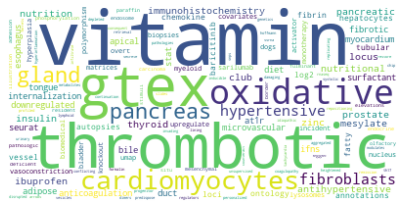

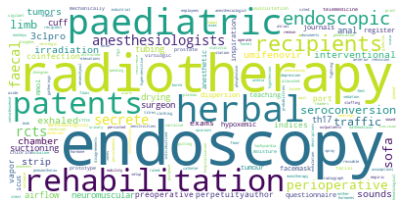

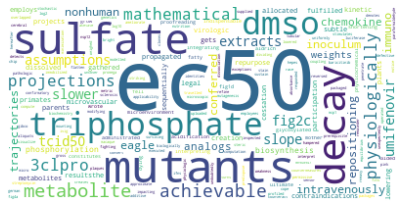

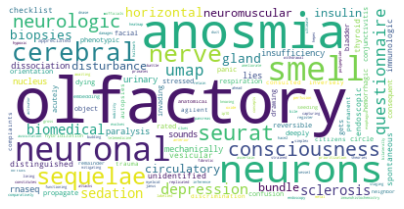

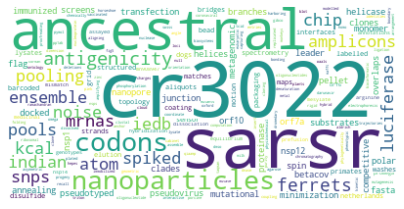

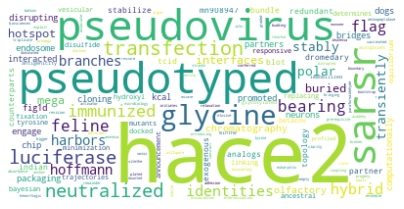

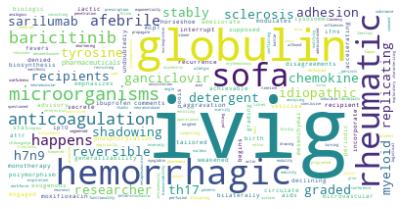

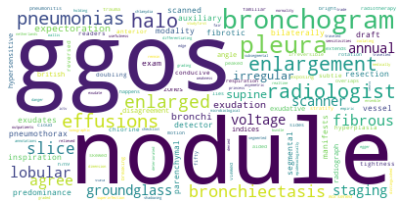

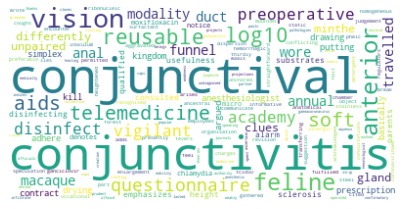

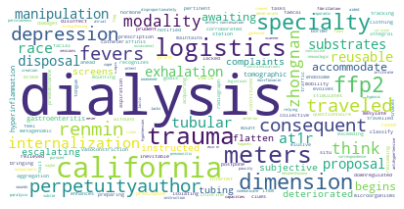

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a', 'funderit']

from collections import Counter
for c in Counter(list(_y_km)):
    print(c)
    words = ' '.join([j for i,j in _clusters[c]])
    new_voc = set(_tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

In [ ]:
clusters_id = defaultdict(list)
for c, l_art in _clusters.items():
    for a in l_art:
        clusters_id[c].append(a[0])
        
with open('level_2_cluster_9.pickle', 'wb') as handle:
    pickle.dump(clusters_id, handle)#, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# Create tfidf matrix
set_doc = [j for i,j in _clusters[1]]
set_names = [i for i,j in _clusters[1]]

#article_text = [(i, ' '.join(j)) for i,j in clean.items()]
#id_articles = {i:j[0] for i,j in enumerate(article_text)}
#articles_id = {j:i for i,j in id_articles.items()}
#docs = [j for i,j in article_text]


_tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 10)
_tfidf_vectorizer_vectors = _tfidf_vectorizer.fit_transform(set_doc)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if j < 3000}

#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


#len(tfidf_vectorizer.vocabulary_)

from sklearn.preprocessing import normalize
#_w_normalized = normalize(_tfidf_vectorizer_vectors, norm='l2', axis=1)

_svd = TruncatedSVD(n_components=20, n_iter=100, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
_Y = _svd.fit_transform(_tfidf_vectorizer_vectors)

# Pick 9 clusters
_km = KMeans(n_clusters=10, init='k-means++')

_y_km = _km.fit_predict(_Y)



_clusters = defaultdict(list)
for i in range(len(_y_km)):
    _clusters[_y_km[i]] += [(set_names[i],set_doc[i])]
    
Counter(_y_km)

Counter({0: 710, 3: 14, 2: 18, 8: 6, 1: 8, 7: 10, 5: 7, 4: 9, 6: 10, 9: 11})

0
2849
3
2849
2
2849
8
2849
1
2849
7
2849
5
2849
4
2849
6
2849
9
2849


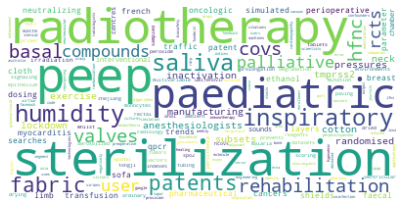

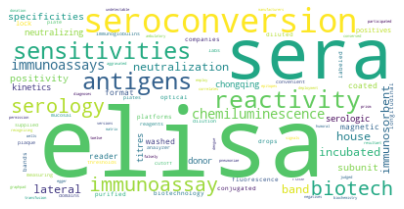

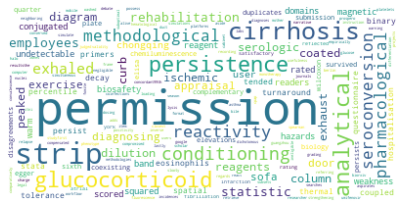

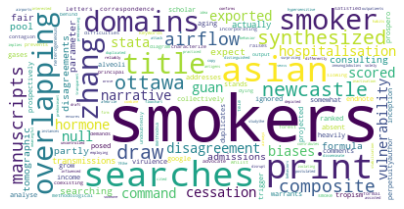

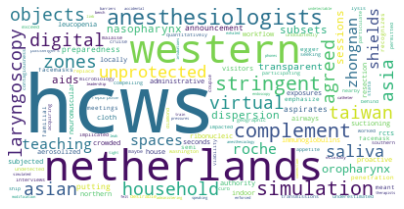

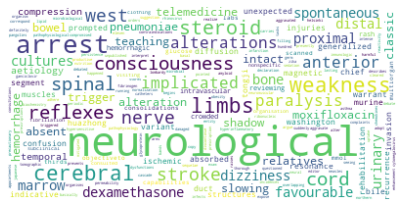

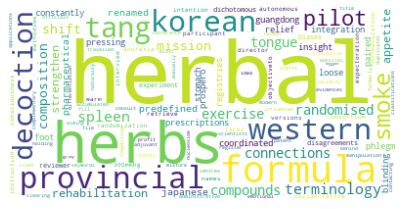

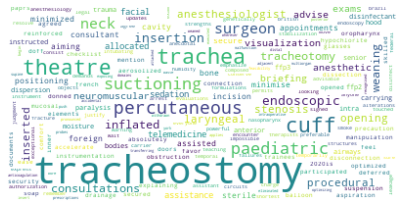

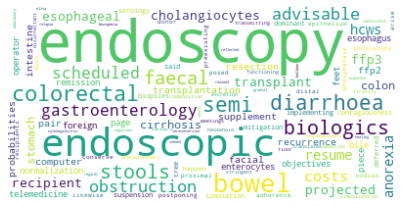

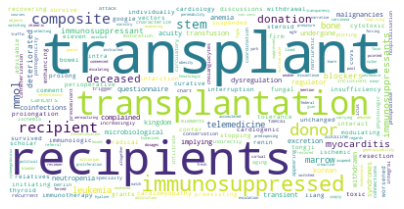

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a']

from collections import Counter
for c in Counter(list(_y_km)):
    print(c)
    words = ' '.join([j for i,j in _clusters[c]])
    new_voc = set(_tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

In [ ]:
clusters_id = defaultdict(list)
for c, l_art in _clusters.items():
    for a in l_art:
        clusters_id[c].append(a[0])
        
with open('level_3_cluster_9_1.pickle', 'wb') as handle:
    pickle.dump(clusters_id, handle)#, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# Create tfidf matrix
set_doc = [j for i,j in _clusters[1]]
set_names = [i for i,j in _clusters[1]]

#article_text = [(i, ' '.join(j)) for i,j in clean.items()]
#id_articles = {i:j[0] for i,j in enumerate(article_text)}
#articles_id = {j:i for i,j in id_articles.items()}
#docs = [j for i,j in article_text]


_tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 10)
_tfidf_vectorizer_vectors = _tfidf_vectorizer.fit_transform(set_doc)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if j < 3000}

#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


#len(tfidf_vectorizer.vocabulary_)

from sklearn.preprocessing import normalize
#_w_normalized = normalize(_tfidf_vectorizer_vectors, norm='l2', axis=1)

_svd = TruncatedSVD(n_components=20, n_iter=100, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
_Y = _svd.fit_transform(_tfidf_vectorizer_vectors)

# Pick 9 clusters
_km = KMeans(n_clusters=10, init='k-means++')

_y_km = _km.fit_predict(_Y)



_clusters = defaultdict(list)
for i in range(len(_y_km)):
    _clusters[_y_km[i]] += [(set_names[i],set_doc[i])]
    
Counter(_y_km)

Counter({0: 1166, 3: 307, 4: 10, 8: 4, 9: 8, 5: 15, 2: 18, 6: 11, 1: 10, 7: 6})

0
3752
3
3752
4
3752
8
3752
9
3752
5
3752
2
3752
6
3752
1
3752
7
3752


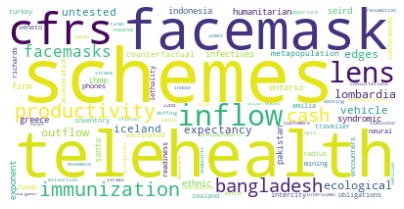

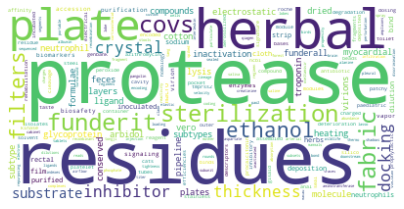

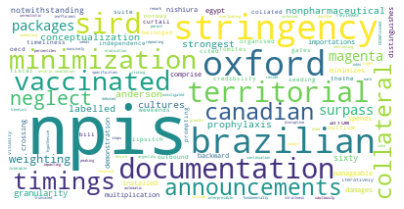

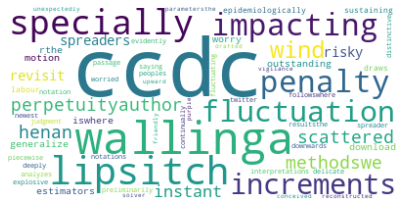

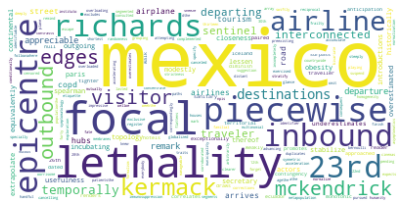

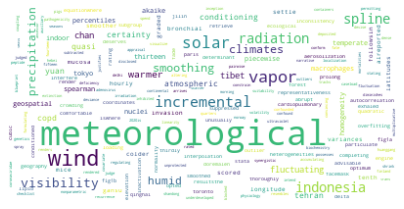

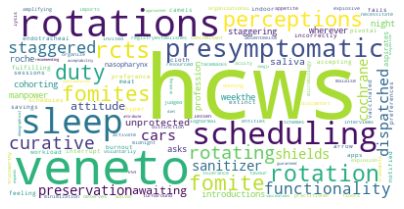

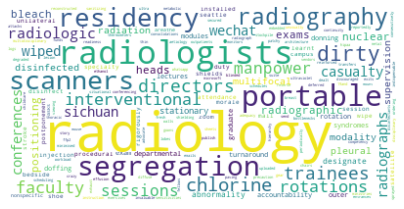

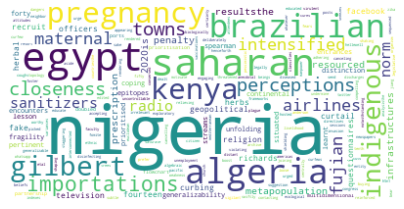

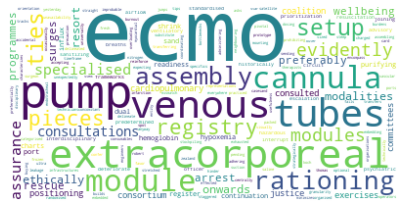

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a']

from collections import Counter
for c in Counter(list(_y_km)):
    print(c)
    words = ' '.join([j for i,j in _clusters[c]])
    new_voc = set(_tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

# Second cluster

In [ ]:
# Create tfidf matrix
set_doc = [j for i,j in clusters[0]]
set_names = [i for i,j in clusters[0]]

#article_text = [(i, ' '.join(j)) for i,j in clean.items()]
#id_articles = {i:j[0] for i,j in enumerate(article_text)}
#articles_id = {j:i for i,j in id_articles.items()}
#docs = [j for i,j in article_text]


_tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 10)
_tfidf_vectorizer_vectors = _tfidf_vectorizer.fit_transform(set_doc)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if j < 3000}

#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


#len(tfidf_vectorizer.vocabulary_)

from sklearn.preprocessing import normalize
#_w_normalized = normalize(_tfidf_vectorizer_vectors, norm='l2', axis=1)

_svd = TruncatedSVD(n_components=20, n_iter=100, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
_Y = _svd.fit_transform(_tfidf_vectorizer_vectors)

# Pick 9 clusters
_km = KMeans(n_clusters=10, init='k-means++')

_y_km = _km.fit_predict(_Y)



_clusters = defaultdict(list)
for i in range(len(_y_km)):
    _clusters[_y_km[i]] += [(set_names[i],set_doc[i])]
    
Counter(_y_km)

Counter({0: 81,
         2: 482,
         1: 984,
         6: 18,
         9: 17,
         3: 8,
         5: 10,
         4: 10,
         8: 17,
         7: 15})

0
4225
2
4225
1
4225
6
4225
9
4225
3
4225
5
4225
4
4225
8
4225
7
4225


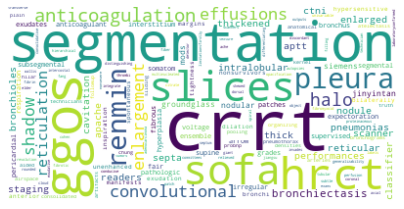

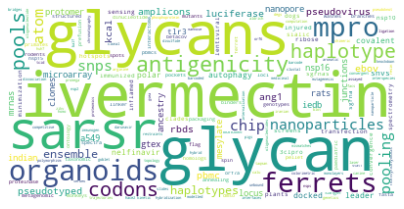

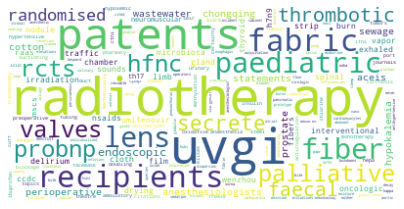

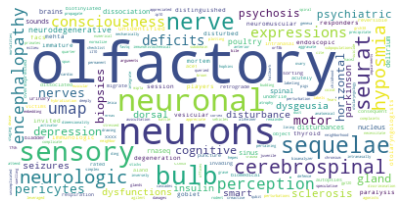

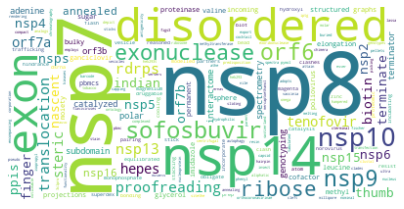

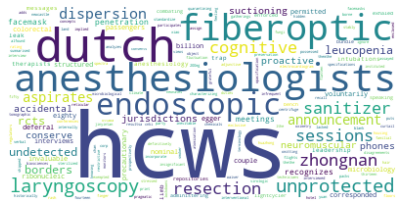

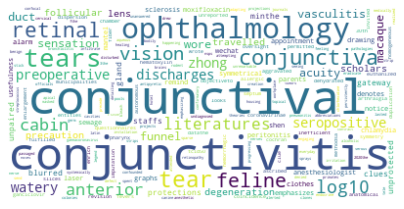

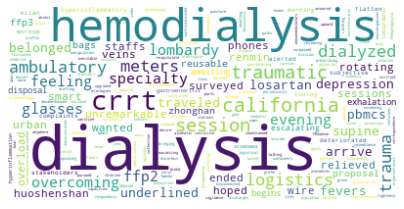

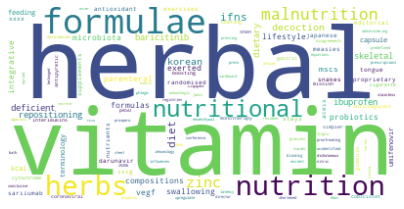

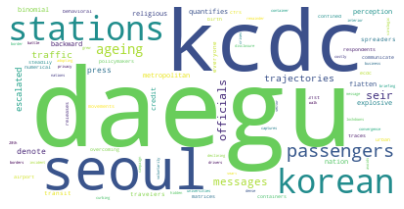

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a']

from collections import Counter
for c in Counter(list(_y_km)):
    print(c)
    words = ' '.join([j for i,j in _clusters[c]])
    new_voc = set(_tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

In [ ]:
# Create tfidf matrix
set_doc = [j for i,j in _clusters[1]]
set_names = [i for i,j in _clusters[1]]

#article_text = [(i, ' '.join(j)) for i,j in clean.items()]
#id_articles = {i:j[0] for i,j in enumerate(article_text)}
#articles_id = {j:i for i,j in id_articles.items()}
#docs = [j for i,j in article_text]


_tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 30,
                                  min_df = 10)
_tfidf_vectorizer_vectors = _tfidf_vectorizer.fit_transform(set_doc)

#voc = {i:j for i,j in tfidf_vectorizer.vocabulary_.items() if j < 3000}

#less_words_doc = []
#for d in docs:
#    w = d.split(' ')
#    less_words_doc.append(' '.join([i for i in w if i in voc]))
    
# Create tfidf matrix
#tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
#                                  max_df = 20,
#                                  min_df = 10)
#tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(less_words_doc)


#len(tfidf_vectorizer.vocabulary_)

from sklearn.preprocessing import normalize
#_w_normalized = normalize(_tfidf_vectorizer_vectors, norm='l2', axis=1)

_svd = TruncatedSVD(n_components=20, n_iter=100, random_state=1, algorithm='arpack')
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
_Y = _svd.fit_transform(_tfidf_vectorizer_vectors)

# Pick 9 clusters
_km = KMeans(n_clusters=10, init='k-means++')

_y_km = _km.fit_predict(_Y)



_clusters = defaultdict(list)
for i in range(len(_y_km)):
    _clusters[_y_km[i]] += [(set_names[i],set_doc[i])]
    
Counter(_y_km)

Counter({0: 687, 1: 202, 6: 8, 4: 10, 7: 15, 8: 9, 2: 5, 5: 29, 9: 9, 3: 10})

0
3141
1
3141
6
3141
4
3141
7
3141
8
3141
2
3141
5
3141
9
3141
3
3141


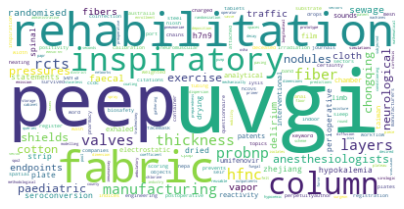

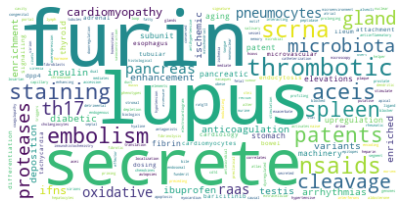

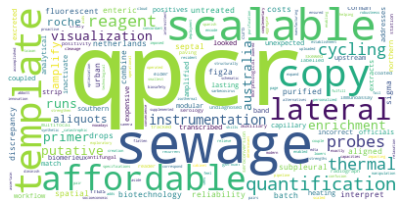

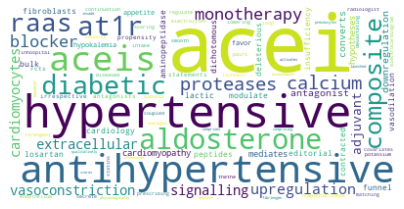

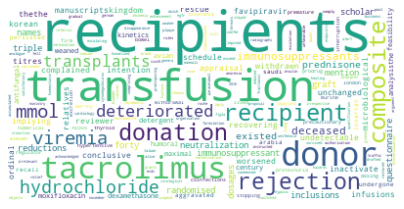

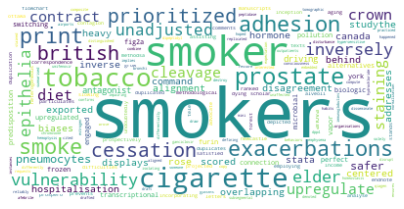

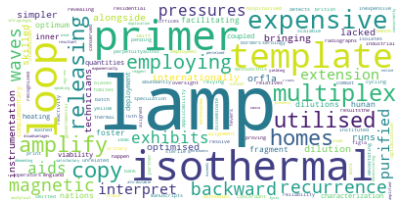

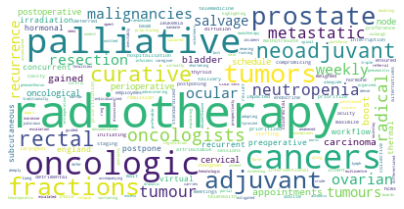

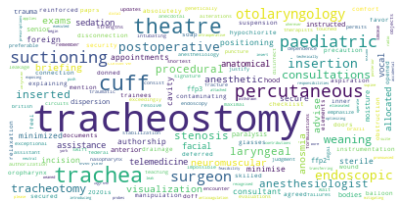

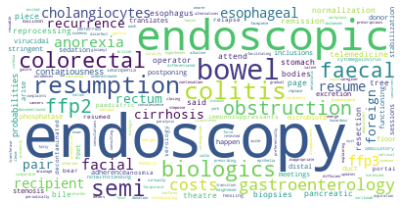

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study',
                               'reviewers', 'al2020', '2020a']

from collections import Counter
for c in Counter(list(_y_km)):
    print(c)
    words = ' '.join([j for i,j in _clusters[c]])
    new_voc = set(_tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])

    if len(single_words)>0:

        wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                               normalize_plurals = False,
                              collocations = False).generate(single_words)

        plt.figure(figsize=[7,7])
        plt.imshow(wordcloud,  interpolation='bilinear')
        plt.axis("off")

# Prova

In [ ]:
import numpy as np

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)



AttributeError: 'AgglomerativeClustering' object has no attribute 'distances_'

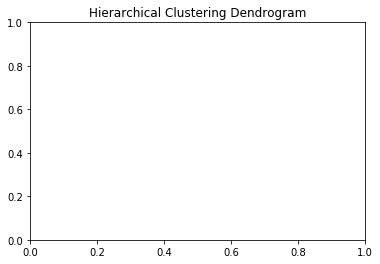

In [ ]:
#iris = load_iris()
X = _tfidf_vectorizer_vectors

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0.5, n_clusters=None)

model = model.fit(X.toarray())
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

## SVD

In [ ]:
svd_variance_explained = []

for i in [10, 25, 50, 75, 100, 200, 400, 500]:
    print(i)
    svd = TruncatedSVD(n_components=i, n_iter=10, random_state=10, algorithm='arpack')
    #normalizer = Normalizer(copy=False)
    #lsa = make_pipeline(svd, normalizer)
    Y = svd.fit_transform(tfidf_vectorizer_vectors)
    
    svd_variance_explained += [svd.explained_variance_ratio_[:i].sum()]


10
25
50
75
100
200
400
500


Text(0, 0.5, 'Variance explained')

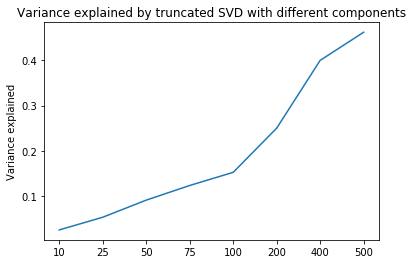

In [ ]:
plt.plot(range(8), svd_variance_explained)
plt.xticks(range(8),[10, 25, 50, 75, 100, 200,  400, 500])
plt.title('Variance explained by truncated SVD with different components')
plt.ylabel('Variance explained')

## Similarity given a document

Qui si può cambiare per avere una lista dei più simili.

In [ ]:
from scipy.spatial.distance import cosine 

doc = 0
max_sim = 0
id_max = None
for i in range(Y.shape[0]):
    cosine_similarity = 1 - cosine(Y[doc], Y[i])
    if max_sim < cosine_similarity and i != doc:
        max_sim = cosine_similarity
        id_max = i
        

/opt/anaconda3/lib/python3.7/site-packages/scipy/spatial/distance.py:720: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


In [ ]:
max_sim

0.9479151586746362

In [ ]:
id_max

236

In [ ]:
id_articles[doc]

'0765596362e6b109eb040cd725aea94690cdafdf'

In [ ]:
id_articles[id_max]

'22a27a3a91fab8a660084d44a541a49bc824ca86'

## Clustering

### K-means++
Non l'ho guardato, probabilmente va rifinito e si deve controllare che tfidf sia fatto bene (lo so lo sta facendo la libreria, però magari mess up qualcosa)

In [ ]:
from sklearn import metrics
from sklearn.cluster import KMeans

* Ho messo due componenti per vedere il plot

In [ ]:
from sklearn.preprocessing import normalize
w_normalized = normalize(tfidf_vectorizer_vectors, norm='l1', axis=1)

svd = TruncatedSVD(n_components=10, n_iter=10, random_state=1)
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
Y = svd.fit_transform(w_normalized)

In [ ]:
distortions = []

for j in range(2, 50):

    # KMeans
    km = KMeans(n_clusters=j, init='k-means++')
    km.fit(Y)

    
    print("ELBOW SCORE FOR K", j, " : ", km.inertia_)
    distortions.append(km.inertia_)


ELBOW SCORE FOR K 2  :  28.402729709067668
ELBOW SCORE FOR K 3  :  24.805490258374487
ELBOW SCORE FOR K 4  :  21.675553129640395
ELBOW SCORE FOR K 5  :  18.590683728935083
ELBOW SCORE FOR K 6  :  15.782738906411998
ELBOW SCORE FOR K 7  :  13.006045116483328
ELBOW SCORE FOR K 8  :  10.33400039641005
ELBOW SCORE FOR K 9  :  7.794602011382195
ELBOW SCORE FOR K 10  :  5.34629409962251
ELBOW SCORE FOR K 11  :  3.3008966862041045
ELBOW SCORE FOR K 12  :  2.8535082479386022
ELBOW SCORE FOR K 13  :  2.520887954426156
ELBOW SCORE FOR K 14  :  2.2678937762533957
ELBOW SCORE FOR K 15  :  2.0148606628936427
ELBOW SCORE FOR K 16  :  1.893452404237841
ELBOW SCORE FOR K 17  :  1.7033352148755263
ELBOW SCORE FOR K 18  :  1.5995909269584034
ELBOW SCORE FOR K 19  :  1.4787599228047714
ELBOW SCORE FOR K 20  :  1.3854677219783529
ELBOW SCORE FOR K 21  :  1.2760300237259343
ELBOW SCORE FOR K 22  :  1.2188358168445093
ELBOW SCORE FOR K 23  :  1.121444142240059
ELBOW SCORE FOR K 24  :  1.0372413491589563
ELB

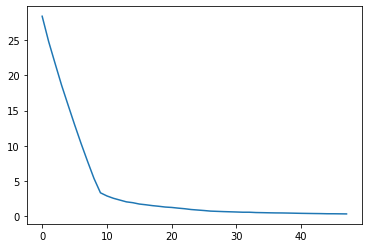

In [ ]:
plt.plot(range(len(distortions)), distortions)

In [ ]:
svd = TruncatedSVD(n_components=5, n_iter=10, random_state=1)
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
Y = svd.fit_transform(tfidf_vectorizer_vectors)

# Pick 9 clusters
km = KMeans(n_clusters=20, init='k-means++')

y_km = km.fit_predict(Y)

In [ ]:
Counter(y_km)

Counter({17: 717,
         0: 998,
         8: 121,
         19: 20,
         13: 49,
         11: 76,
         14: 524,
         16: 34,
         6: 245,
         10: 194,
         1: 8,
         4: 8,
         12: 16,
         18: 70,
         9: 28,
         3: 9,
         7: 7,
         15: 2,
         5: 23,
         2: 6})

In [ ]:
clusters = defaultdict(list)
for i in range(len(y_km)):
    clusters[y_km[i]] += [article_text[i][1]]

In [ ]:
# Create tfidf matrix
tfidf_vectorizer = TfidfVectorizer(use_idf=True, 
                                  max_df = 8,
                                  min_df = 5)
tfidf_vectorizer_vectors = tfidf_vectorizer.fit_transform(clusters[0])

In [ ]:
svd = TruncatedSVD(n_components=15, n_iter=10, random_state=1)
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
Y = svd.fit_transform(tfidf_vectorizer_vectors)

In [ ]:
# Pick 9 clusters
km = KMeans(n_clusters=30, init='k-means++')

y_km = km.fit_predict(Y)

In [ ]:
Counter(y_km)

Counter({2: 711,
         17: 1159,
         1: 15,
         23: 276,
         0: 64,
         3: 6,
         5: 4,
         25: 3,
         24: 64,
         27: 47,
         9: 5,
         10: 5,
         7: 7,
         22: 6,
         19: 5,
         14: 4,
         12: 4,
         13: 6,
         4: 5,
         15: 8,
         29: 2,
         26: 2,
         18: 5,
         11: 4,
         20: 15,
         16: 4,
         28: 17,
         21: 13,
         6: 6,
         8: 10})

In [ ]:
import numpy as np
import pandas as pd
from os import path
import pickle

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from tqdm import tqdm_notebook as tqdm

import matplotlib.pyplot as plt

In [ ]:
stop_words = list(STOPWORDS) + ['preprint', 'license', 'medrxiv', 'copyright', 'reviewed',
                                'peer', 'patients', 'covid', 'author', 'may', 'figure', 'used', 
                               'funded', 'made', 'cases', 'available', 'display', 'funder', 'granted', 'study']

17
3000
0
3000
8
3000
19
3000
13
3000
11
3000
14
3000
16
3000
6
3000
10
3000
1
3000
4
3000
12
3000
18
3000
9
3000
3
3000
7
3000
15
3000
5
3000
2
3000


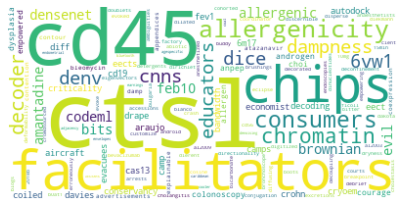

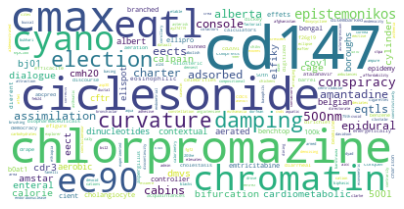

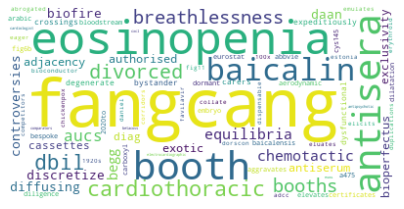

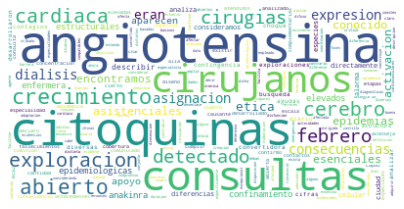

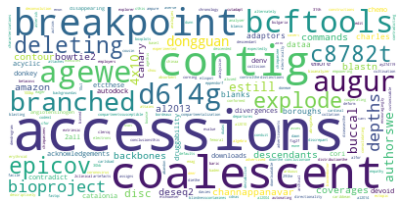

...

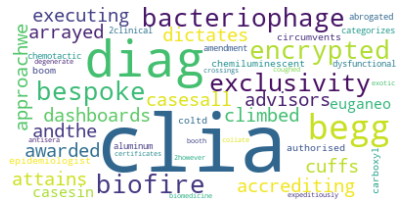

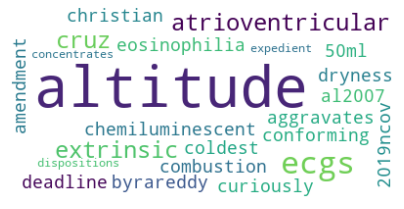

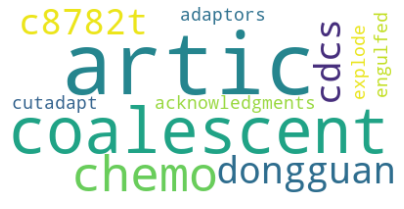

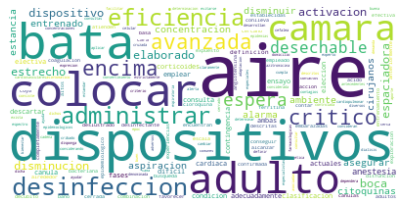

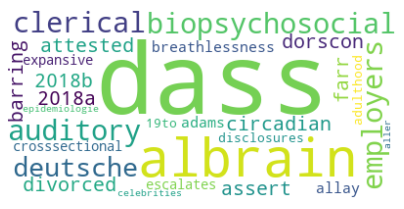

In [ ]:
from collections import Counter
for c in Counter(list(y_km)):
    print(c)
    words = ' '.join(clusters[c])
    new_voc = set(tfidf_vectorizer.vocabulary_)
    print(len(new_voc))
    single_words = ' '.join([i for i in words.split(' ') if i in new_voc])



    wordcloud = WordCloud(stopwords=stop_words, background_color="white", 
                           normalize_plurals = False,
                          collocations = False).generate(single_words)
    
    plt.figure(figsize=[7,7])
    plt.imshow(wordcloud,  interpolation='bilinear')
    plt.axis("off")

In [ ]:
Y[y_km == 0, 0]#, 

array([0.24387023, 0.18852952, 0.26254778, 0.20179879, 0.24302412,
       0.23844757, 0.26967654, 0.24536382, 0.21009737, 0.27351461,
       0.22247352, 0.26833501, 0.21985289, 0.29309483, 0.17996109,
       0.20801387])

In [ ]:
Y[y_km == 0, 1]

array([-0.11996771,  0.00735573,  0.03214205, -0.00327675, -0.10663009,
       -0.04950728, -0.11975527, -0.01528238, -0.02113655, -0.0511503 ,
        0.03475809, -0.0749532 , -0.0299362 , -0.01078207, -0.07674358,
       -0.02659488])

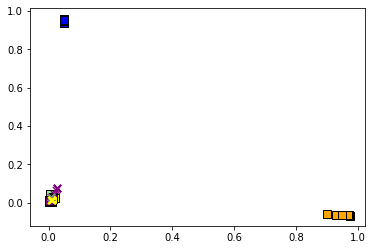

In [ ]:
plt.scatter(
    Y[y_km == 0, 0], Y[y_km == 0, 1],
    s=50, c='lightgreen',
    marker='s', edgecolor='black',
    label='cluster 1'
)

plt.scatter(
    Y[y_km == 1, 0], Y[y_km == 1, 1],
    s=50, c='orange',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 2, 0], Y[y_km == 2, 1],
    s=50, c='blue',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 3, 0], Y[y_km == 3, 1],
    s=50, c='yellow',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 4, 0], Y[y_km == 4, 1],
    s=50, c='grey',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 5, 0], Y[y_km == 5, 1],
    s=50, c='purple',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 6, 0], Y[y_km == 6, 1],
    s=50, c='purple',
    marker='x', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 7, 0], Y[y_km == 7, 1],
    s=50, c='grey',
    marker='x', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    Y[y_km == 8, 0], Y[y_km == 8, 1],
    s=50, c='yellow',
    marker='x', edgecolor='black',
    label='cluster 2'
)

### t-SNE

In [ ]:
svd = TruncatedSVD(n_components=400, n_iter=10, random_state=1)
#normalizer = Normalizer(copy=False)
#lsa = make_pipeline(svd, normalizer)
Y = svd.fit_transform(tfidf_vectorizer_vectors)

In [ ]:
import numpy as np
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2).fit_transform(Y)
X_embedded.shape

(160, 2)

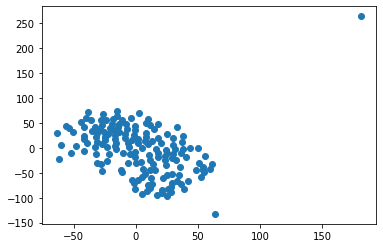

In [ ]:
plt.scatter(X_embedded[:,0], X_embedded[:,1])

In [ ]:
distortions = []

for j in range(2, 50):

    # KMeans
    km = KMeans(n_clusters=j, init='k-means++')
    km.fit(X_embedded)

    
    print("ELBOW SCORE FOR K", j, " : ", km.inertia_)
    distortions.append(km.inertia_)


ELBOW SCORE FOR K 2  :  280264.7912745398
ELBOW SCORE FOR K 3  :  186934.57219758723
ELBOW SCORE FOR K 4  :  130986.9377021593
ELBOW SCORE FOR K 5  :  100006.18649789132
ELBOW SCORE FOR K 6  :  80391.72359284961
ELBOW SCORE FOR K 7  :  67316.15387429157
ELBOW SCORE FOR K 8  :  59032.288421020974
ELBOW SCORE FOR K 9  :  51331.12740908464
ELBOW SCORE FOR K 10  :  45689.628698952496
ELBOW SCORE FOR K 11  :  41284.58670428768
ELBOW SCORE FOR K 12  :  38811.016298712464
ELBOW SCORE FOR K 13  :  34833.34327359591
ELBOW SCORE FOR K 14  :  30820.99438147433
ELBOW SCORE FOR K 15  :  28666.83703779336
ELBOW SCORE FOR K 16  :  25945.622826805877
ELBOW SCORE FOR K 17  :  24263.23600797355
ELBOW SCORE FOR K 18  :  21603.649495738093
ELBOW SCORE FOR K 19  :  19604.371188338962
ELBOW SCORE FOR K 20  :  19143.180186389014
ELBOW SCORE FOR K 21  :  18234.655881767685
ELBOW SCORE FOR K 22  :  16717.340210256414
ELBOW SCORE FOR K 23  :  16244.088324139651
ELBOW SCORE FOR K 24  :  15704.587372937705
ELBOW 

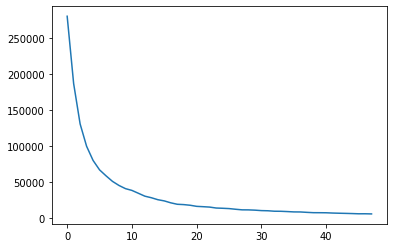

In [ ]:
plt.plot(range(len(distortions)), distortions)

In [ ]:
km = KMeans(n_clusters=9, init='k-means++')

y_km = km.fit_predict(X_embedded)

In [ ]:
from collections import Counter
Counter(list(y_km))

Counter({5: 21, 0: 22, 4: 18, 1: 23, 8: 19, 6: 11, 7: 26, 2: 19, 3: 1})

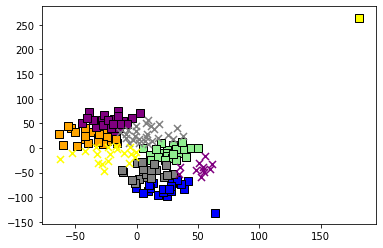

In [ ]:
plt.scatter(
    X_embedded[y_km == 0, 0], X_embedded[y_km == 0, 1],
    s=50, c='lightgreen',
    marker='s', edgecolor='black',
    label='cluster 1'
)

plt.scatter(
    X_embedded[y_km == 1, 0], X_embedded[y_km == 1, 1],
    s=50, c='orange',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 2, 0], X_embedded[y_km == 2, 1],
    s=50, c='blue',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 3, 0], X_embedded[y_km == 3, 1],
    s=50, c='yellow',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 4, 0], X_embedded[y_km == 4, 1],
    s=50, c='grey',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 5, 0], X_embedded[y_km == 5, 1],
    s=50, c='purple',
    marker='s', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 6, 0], X_embedded[y_km == 6, 1],
    s=50, c='purple',
    marker='x', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 7, 0], X_embedded[y_km == 7, 1],
    s=50, c='grey',
    marker='x', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_embedded[y_km == 8, 0], X_embedded[y_km == 8, 1],
    s=50, c='yellow',
    marker='x', edgecolor='black',
    label='cluster 2'
)